# Prior alpha-sweep diagnostic — softening the sawtooth harmonic ladder

The Arioso prior is a polyBLEP **sawtooth** (`DataSynthesizer/synthesizePrior.py::BandlimitedSaw`):
it carries the saw's full **1/n** (-6 dB/oct) harmonic ladder up to Nyquist. Two standing
diagnoses motivate softening it:

- **Exposure bias** — the model's largest off-path residual sits in the *upper harmonics* (the
  un-removed sawtooth excess).
- **Kayser bandwidth defect** — the GT recordings are lowpassed above ~mel bin 108, but the saw
  prior fills that band with energy the model then has to erase.

This notebook builds **alternative priors** without touching the pipeline, and measures them
against the GT target mels:

1. **Power-law tilt** — harmonic amplitudes `a_n = n^-alpha`. `alpha=1` reproduces the saw;
   `alpha>1` rolls off the highs.
2. **Rounded corner** — a Butterworth-style family `a_n = n^-alpha_below / sqrt(1 + (n/n_c)^(2p))`:
   flat-ish 1/n below the corner harmonic `n_c`, then an extra `6*p` dB/oct beyond it. The corner
   is in **harmonic number** (not Hz), so the prior's spectral *shape* is pitch-consistent — the
   right invariance for flow matching.

Everything replicates the production render recipe (`build_prior.py::process_clip` +
`PriorSynth.render`) exactly — per-note polyphonic sum across all tracks, `MaskedRMS` level
match to -20 dBFS, `offset_ms` onset shift — so the only thing that changes between variants is
the harmonic amplitude curve. Metrics: **aggregate mel RMSE** over all frames (the project's
honest scoreboard), **masked RMSE** over sounding frames, **MCD**, and the **per-mel-bin** RMSE
profile. No repo files are edited; results cache under `test notebooks/figs/prior_alpha_sweep/`.

> Caveat: minimizing prior->target mel distance is a proxy — it shortens OT-CFM transport but a
> retrain is the real test. We report per-bin profiles too, so an aggregate win that hides a
> "fixed the HF band, worsened the fundamentals" trade is visible.

In [1]:
%matplotlib inline
import os
import sys
import csv
import time
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

# Run from the project root so Arioso / DataSynthesizer / common import. When executed via
# nbconvert (whose cwd is the notebook's own dir), hop up to the parent project root.
if not os.path.isdir("Arioso") and os.path.isdir(os.path.join("..", "Arioso")):
    os.chdir("..")
_root = os.path.abspath(os.getcwd())
if _root not in sys.path:
    sys.path.insert(0, _root)

import pretty_midi
import librosa
import torch

from DataSynthesizer.config import DEFAULT_DATASET, DEFAULT_OUT, SR, HOP
from DataSynthesizer.synthesizePrior import MaskedRMS
from DataSynthesizer.onset_align import shift_samples
import common.vocoder as vocoder
from common.config import N_MELS
from Arioso.config import PRIOR_MEL_DIR, AriosoConfig
from Arioso.splits import make_split
from Arioso.clips import enumerate_clips
from Arioso.eval.metrics import mcd   # importing pulls torch/model — expected, harmless

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
OUT_DIR = DEFAULT_OUT                       # 'data'
HOP_SIZE = HOP                             # 512
SEED = 0                                    # all sampling is seeded => deterministic reruns

CACHE_DIR = os.path.join("test notebooks", "figs", "prior_alpha_sweep")
os.makedirs(CACHE_DIR, exist_ok=True)

prior_dir = os.path.join(OUT_DIR, PRIOR_MEL_DIR)      # on-disk polyBLEP baseline
target_dir = os.path.join(OUT_DIR, "target_mel")

# Manifest rows (status == ok) as a DataFrame, indexed by basename.
with open(os.path.join(OUT_DIR, "manifest.csv"), newline="", encoding="utf-8") as f:
    manifest = pd.DataFrame([r for r in csv.DictReader(f) if r.get("status") == "ok"])
manifest = manifest.set_index("basename", drop=False)
print(f"device={DEVICE}  ok recordings={len(manifest)}  cache={CACHE_DIR}")
print(f"SR={SR}  HOP={HOP_SIZE}  N_MELS={N_MELS}")


device=cuda  ok recordings=888  cache=test notebooks\figs\prior_alpha_sweep
SR=44100  HOP=512  N_MELS=128


## Variant families

`amps_alpha(alpha)` -> the power-law tilt weights `n^-alpha` (`alpha=1` == the saw's 1/n ladder).

`amps_corner(n_c, p, alpha_below=1.0)` -> the harmonic-number-rounded saw
`n^-alpha_below / sqrt(1 + (n/n_c)^(2p))`: for `n << n_c` it is essentially `n^-alpha_below`
(the baseline tilt); beyond the **corner harmonic** `n_c` it rolls off an extra `6*p` dB/oct.
Because the corner is indexed by *harmonic number*, not a fixed Hz cutoff, the prior's spectral
envelope shape is identical at every pitch — a pitch-consistent prior, which is what OT-CFM
transport wants (the field learns one shape, not a pitch-dependent one).

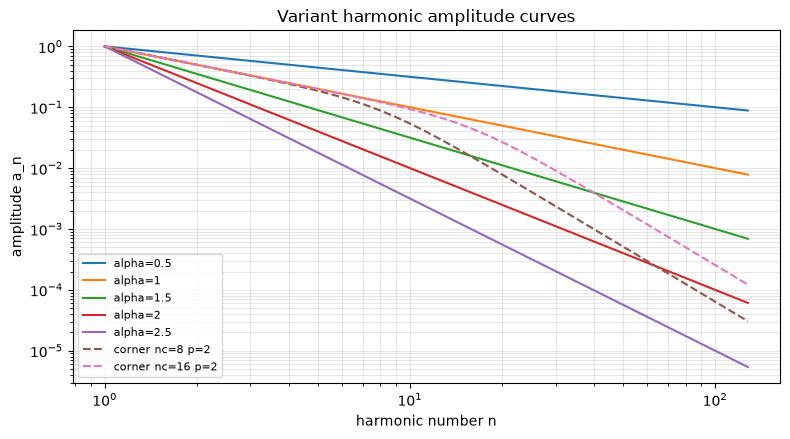

In [2]:
def amps_alpha(alpha):
    """Power-law harmonic amplitudes a_n = n^-alpha (n=1..N harmonic numbers)."""
    return lambda n: n.astype(np.float64) ** (-float(alpha))


def amps_corner(n_c, p, alpha_below=1.0):
    """Butterworth-style rounded saw: n^-alpha_below / sqrt(1 + (n/n_c)^(2p)).

    Flat-ish n^-alpha_below below the corner HARMONIC n_c, extra 6*p dB/oct above it.
    Corner is in harmonic number, so the shape is pitch-consistent.
    """
    n_c, p, alpha_below = float(n_c), float(p), float(alpha_below)
    def fn(n):
        n = n.astype(np.float64)
        return n ** (-alpha_below) / np.sqrt(1.0 + (n / n_c) ** (2.0 * p))
    return fn


def variant_label(kind, **kw):
    if kind == "alpha":
        return f"alpha={kw['alpha']:g}"
    if kind == "corner":
        return f"corner nc={kw['n_c']:g} p={kw['p']:g} ab={kw['alpha_below']:g}"
    if kind == "baseline":
        return "baseline (on-disk polyBLEP)"
    raise ValueError(kind)


# Quick look at the amplitude curves the variants impose on the harmonic ladder.
_n = np.arange(1, 129, dtype=np.float64)
fig, ax = plt.subplots(figsize=(8, 4.5))
for a in (0.5, 1.0, 1.5, 2.0, 2.5):
    ax.loglog(_n, amps_alpha(a)(_n), label=f"alpha={a:g}")
for nc in (8, 16):
    ax.loglog(_n, amps_corner(nc, 2, 1.0)(_n), "--", label=f"corner nc={nc} p=2")
ax.set_xlabel("harmonic number n"); ax.set_ylabel("amplitude a_n")
ax.set_title("Variant harmonic amplitude curves"); ax.legend(fontsize=8); ax.grid(True, which="both", alpha=0.3)
fig.tight_layout(); fig.savefig(os.path.join(CACHE_DIR, "amplitude_curves.png"), dpi=110)
display(fig); plt.close(fig)


## Multi-variant renderer + metric helpers

`render_variants(midi_path, n_samples, amp_fns)` replicates `PriorSynth.render` but renders an
**additive sine bank** instead of the saw. Per note it builds the band-limited harmonic bank
`sin(2*pi*n*phase)` `[N, n]` **once** (N = harmonics below Nyquist, `max(1, int((SR/2*0.999)//f0))`;
chunked if `N*n` exceeds ~40M elements to bound memory), then a single `[V,N] @ [N,n]` matmul
serves the whole variant grid — the entire alpha sweep costs barely more than one render. Notes
sum across all instrument tracks (polyphony); `n<=1` notes skipped; velocity scaling `vel/127`.

After the note loop each variant goes through its **own** `MaskedRMS` fit/apply (level is re-fit
per variant so we compare spectral *shape*, not loudness), then `shift_samples(.., offset_ms/1000)`
(no negation), then the BigVGAN mel. Frame count is asserted `== n_frames == target T`.

`mel_metrics` returns `{rmse, masked_rmse, mcd, per_bin_rmse}`. `masked` selects **sounding**
frames from the shifted `sounding` array (reshaped per hop, `.any(axis=1)`).

In [3]:
_BANK_CHUNK_ELEMS = 40e6   # cap on N*n per sine-bank matmul, to bound memory


def render_variants(midi_path, n_samples, amp_fns):
    """Additive re-render of a MIDI score for many amplitude variants at once.

    Returns (outs [V, n_samples] float64 raw sums, sounding [n_samples] bool).
    """
    V = len(amp_fns)
    pm = pretty_midi.PrettyMIDI(midi_path)
    outs = np.zeros((V, n_samples), dtype=np.float64)
    sounding = np.zeros(n_samples, dtype=bool)
    for inst in pm.instruments:
        for note in inst.notes:
            start = max(0, int(round(note.start * SR)))
            end = min(n_samples, int(round(note.end * SR)))
            n = end - start
            if n <= 1:
                continue
            f0 = pretty_midi.note_number_to_hz(note.pitch)
            N = max(1, int((SR / 2 * 0.999) // f0))          # band-limit below Nyquist
            harms = np.arange(1, N + 1, dtype=np.float64)     # [N]
            A = np.stack([fn(harms) for fn in amp_fns], axis=0)  # [V, N]
            phase = np.arange(n, dtype=np.float64) * (f0 / SR)   # [n]  (constant f0)
            vel = note.velocity / 127.0
            if N * n <= _BANK_CHUNK_ELEMS:
                bank = np.sin(2.0 * np.pi * np.outer(harms, phase))   # [N, n]
                outs[:, start:end] += (A @ bank) * vel
            else:
                step = max(1, int(_BANK_CHUNK_ELEMS // n))
                for h0 in range(0, N, step):
                    hs = harms[h0:h0 + step]
                    bank = np.sin(2.0 * np.pi * np.outer(hs, phase))
                    outs[:, start:end] += (A[:, h0:h0 + step] @ bank) * vel
            sounding[start:end] = True
    return outs, sounding


def score_sounding(midi_path, n_samples):
    """Sounding-sample mask straight from the score (no audio render) — for baseline rows."""
    pm = pretty_midi.PrettyMIDI(midi_path)
    sounding = np.zeros(n_samples, dtype=bool)
    for inst in pm.instruments:
        for note in inst.notes:
            start = max(0, int(round(note.start * SR)))
            end = min(n_samples, int(round(note.end * SR)))
            if end - start > 1:
                sounding[start:end] = True
    return sounding


def variant_mel(raw, sounding, offset_ms):
    """One variant's raw float64 sum -> leveled, onset-shifted, BigVGAN mel [N_MELS, T] float32."""
    prior = raw.astype(np.float32)
    leveler = MaskedRMS()                                   # default target -20 dBFS
    gain = leveler.fit(prior, sounding)
    prior = leveler.apply(prior, gain)
    prior = shift_samples(prior, float(offset_ms) / 1000.0)  # no sign negation
    mel = vocoder.mel_spectrogram(prior, device=DEVICE)[0].cpu().numpy().astype(np.float32)
    return mel


def sounding_frame_mask(sounding, T):
    """Shifted sounding samples -> per-frame boolean [T] (a hop counts if ANY sample sounds)."""
    need = T * HOP_SIZE
    s = sounding.astype(bool)
    if len(s) < need:
        s = np.concatenate([s, np.zeros(need - len(s), dtype=bool)])
    else:
        s = s[:need]
    return s.reshape(T, HOP_SIZE).any(axis=1)


def mel_metrics(prior_mel, target_mel, frame_mask=None):
    """Aggregate RMSE, masked RMSE (sounding frames), MCD, per-bin RMSE [N_MELS]."""
    T = min(prior_mel.shape[-1], target_mel.shape[-1])
    p, g = prior_mel[:, :T], target_mel[:, :T]
    diff = p - g
    rmse = float(np.sqrt(np.mean(diff ** 2)))
    per_bin = np.sqrt(np.mean(diff ** 2, axis=1)).astype(np.float32)   # [N_MELS]
    if frame_mask is not None:
        m = frame_mask[:T]
        masked_rmse = float(np.sqrt(np.mean(diff[:, m] ** 2))) if m.any() else float("nan")
    else:
        masked_rmse = float("nan")
    return {"rmse": rmse, "masked_rmse": masked_rmse,
            "mcd": mcd(p, g), "per_bin_rmse": per_bin}


def load_mel(path, sl=None):
    m = np.load(path, mmap_mode="r")
    m = m[:, sl] if sl is not None else m[:]
    return np.ascontiguousarray(m, dtype=np.float32)


def midi_path_for(base):
    row = manifest.loc[base]
    return os.path.join(DEFAULT_DATASET, row["book"], base + ".mid")


## Part 1 — small visual validation (4 train recordings, 1 clip each)

Four seeded book-stratified train recordings, one mid-recording clip each (via `make_split` +
`enumerate_clips`). For each clip we render the variant set
`{alpha 0.5, 1.0, 1.5, 2.0, corner nc=8 p=2, corner nc=16 p=2}` and plot: the **target** mel, the
**on-disk baseline** prior, then per variant `(prior mel | prior-target delta)` with RMSE
annotated. Mels share a magma scale; deltas are coolwarm at +/-2 (matching `eval/metrics._delta_plot`).
Expectation: `alpha>1` variants show the HF excess (top of the delta) shrink vs the baseline.

Part 1 recordings: ['Kayser_Op20-32_MikeChau_ejVllN8z_uc-0004-0137', 'Paganini_Op01-16_WangLiang_06IC3_JQTMk-0000-0091', 'Wohlfahrt_Op45-55_ZYZ_Rw0Hpc6bvNM-0003-0146', 'Kayser_Op20-34_BochanKang_5WrLPU1LEOA-0001-0192']


c:\Users\archi\miniconda3\envs\ai-violin\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\archi\Documents\Coding stuff\AI Violin\common\vocoder.py:134: UserWarning: expandable_segments not supported on this platform (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\c10/cuda/CUDAAllocatorConfig.h:28.)
  wav = wav.float().to(device)


[WARNING] Min value of input waveform signal is -1.0842028856277466
[WARNING] Max value of input waveform signal is 1.3376142978668213


### Kayser_Op20-32_MikeChau_ejVllN8z_uc-0004-0137  `[5508:6376]`

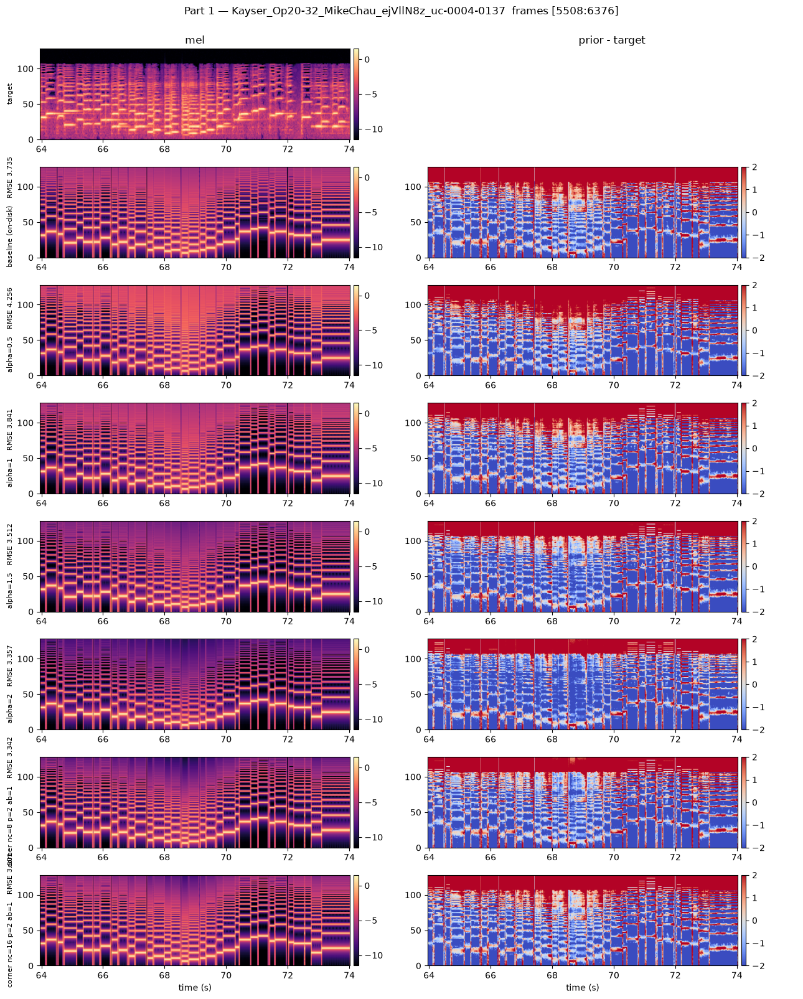

[WARNING] Min value of input waveform signal is -1.4168232679367065
[WARNING] Max value of input waveform signal is 2.1425681114196777


### Paganini_Op01-16_WangLiang_06IC3_JQTMk-0000-0091  `[3525:4386]`

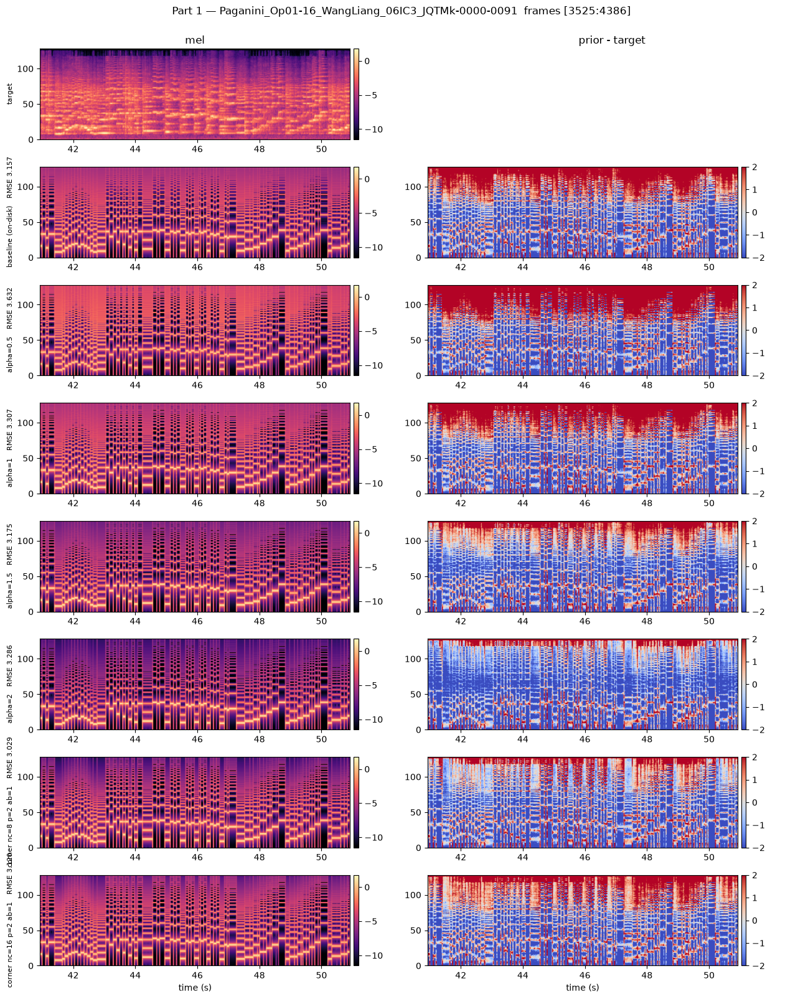

[WARNING] Min value of input waveform signal is -1.3628818988800049
[WARNING] Max value of input waveform signal is 1.813035488128662


### Wohlfahrt_Op45-55_ZYZ_Rw0Hpc6bvNM-0003-0146  `[5923:6775]`

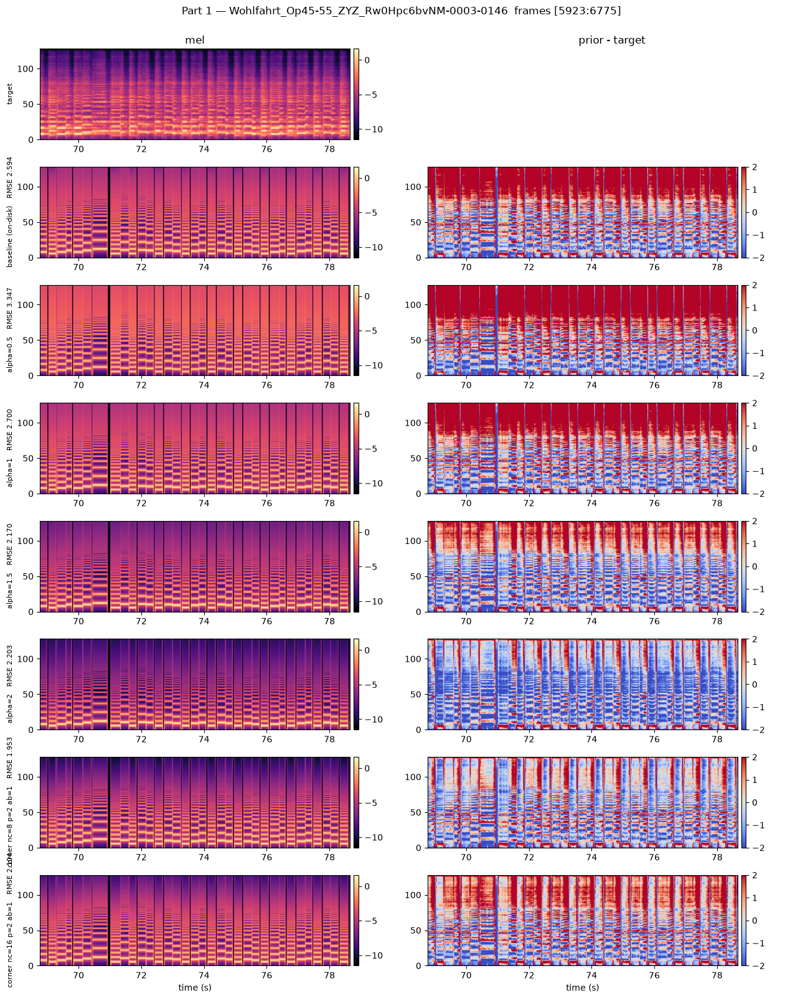

[WARNING] Min value of input waveform signal is -1.264075517654419
[WARNING] Max value of input waveform signal is 1.582158088684082


### Kayser_Op20-34_BochanKang_5WrLPU1LEOA-0001-0192  `[7997:8858]`

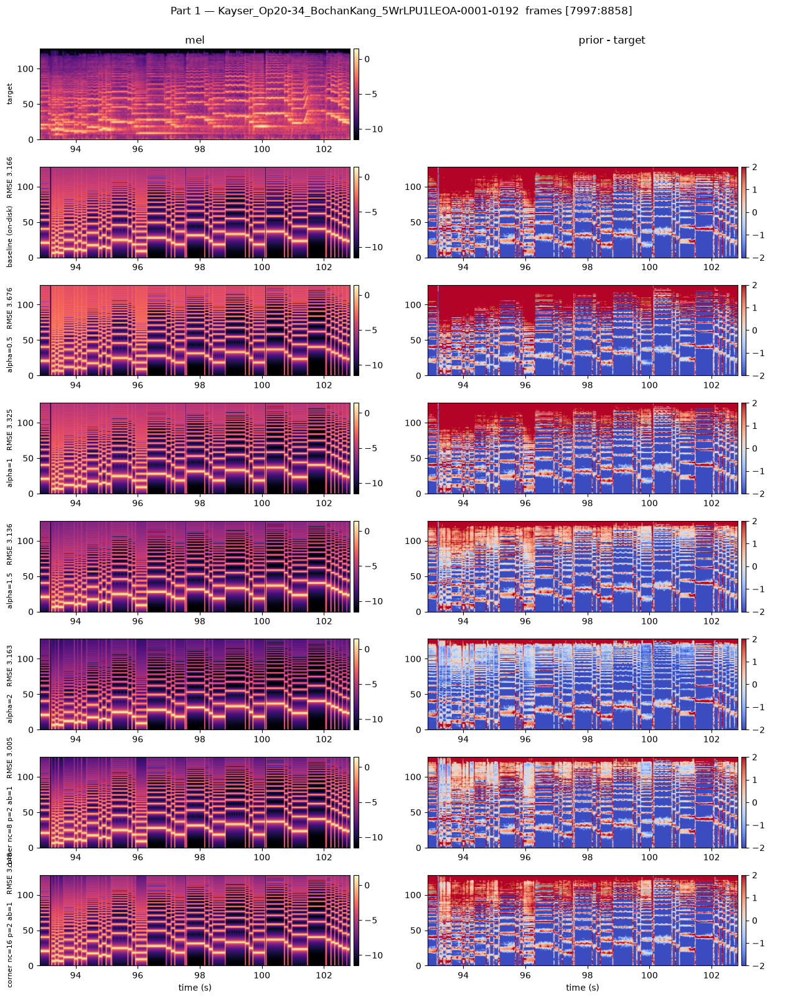

In [4]:
rng = random.Random(SEED)
split = make_split(OUT_DIR)
cfg = AriosoConfig()

# Book-stratified pick of 4 train recordings, then one mid clip each.
train_by_book = {}
for b in split["train"]:
    train_by_book.setdefault(manifest.loc[b, "book"], []).append(b)
books = sorted(train_by_book)
vis_bases = []
bi = 0
while len(vis_bases) < 4 and any(train_by_book.values()):
    bk = books[bi % len(books)]; bi += 1
    pool = train_by_book[bk]
    if pool:
        vis_bases.append(rng.choice(sorted(pool)))
        train_by_book[bk] = [x for x in pool if x != vis_bases[-1]]

vis_clips = {}
for b in vis_bases:
    cl = enumerate_clips(OUT_DIR, [b], cfg)
    vis_clips[b] = cl[len(cl) // 2] if cl else None   # a mid-recording clip
print("Part 1 recordings:", vis_bases)

VIS_VARIANTS = [
    ("alpha", dict(alpha=0.5)), ("alpha", dict(alpha=1.0)),
    ("alpha", dict(alpha=1.5)), ("alpha", dict(alpha=2.0)),
    ("corner", dict(n_c=8, p=2, alpha_below=1.0)),
    ("corner", dict(n_c=16, p=2, alpha_below=1.0)),
]

def build_amp_fns(specs):
    fns = []
    for kind, kw in specs:
        fns.append(amps_alpha(kw["alpha"]) if kind == "alpha" else amps_corner(**kw))
    return fns

vis_amp_fns = build_amp_fns(VIS_VARIANTS)

for b in vis_bases:
    c = vis_clips[b]
    if c is None:
        print("no clip for", b); continue
    sl = slice(c.start, c.end)
    row = manifest.loc[b]
    n_samples = int(row["n_samples"]); offset_ms = float(row["offset_ms"])

    outs, sounding = render_variants(midi_path_for(b), n_samples, vis_amp_fns)
    target_full = load_mel(os.path.join(target_dir, b + ".npy"))
    baseline_full = load_mel(os.path.join(prior_dir, b + ".npy"))
    T = target_full.shape[-1]
    assert outs.shape[1] == n_samples

    # Full-length mels per variant, then slice the clip window for plotting.
    var_mels = []
    for v in range(len(vis_amp_fns)):
        mel = variant_mel(outs[v], sounding, offset_ms)
        assert mel.shape[-1] == int(row["n_frames"]) == T, (mel.shape[-1], row["n_frames"], T)
        var_mels.append(mel)

    tgt = target_full[:, sl]; base_mel = baseline_full[:, sl]
    var_slices = [m[:, sl] for m in var_mels]

    def _rmse(a, bb):
        t = min(a.shape[-1], bb.shape[-1]); return float(np.sqrt(np.mean((a[:, :t] - bb[:, :t]) ** 2)))

    rows_plot = [("target", tgt, None), ("baseline (on-disk)", base_mel, _rmse(base_mel, tgt))]
    for (kind, kw), m in zip(VIS_VARIANTS, var_slices):
        rows_plot.append((variant_label(kind, **kw), m, _rmse(m, tgt)))

    vmin = min(x[1].min() for x in rows_plot); vmax = max(x[1].max() for x in rows_plot)
    extent = [c.start * HOP_SIZE / SR, c.end * HOP_SIZE / SR, 0, N_MELS]
    nrow = len(rows_plot)
    fig, axes = plt.subplots(nrow, 2, figsize=(13, 2.0 * nrow),
                             gridspec_kw={"width_ratios": [1, 1]}, squeeze=False)
    for r, (name, m, rm) in enumerate(rows_plot):
        im = axes[r, 0].imshow(m, origin="lower", aspect="auto", extent=extent,
                               vmin=vmin, vmax=vmax, cmap="magma")
        ann = f"{name}" + ("" if rm is None else f"   RMSE {rm:.3f}")
        axes[r, 0].set_ylabel(ann, fontsize=8)
        if name == "target":
            axes[r, 1].axis("off")
        else:
            delta = m[:, :tgt.shape[-1]] - tgt[:, :m.shape[-1]]
            imd = axes[r, 1].imshow(delta, origin="lower", aspect="auto", extent=extent,
                                    vmin=-2, vmax=2, cmap="coolwarm")
            fig.colorbar(imd, ax=axes[r, 1], pad=0.01)
        fig.colorbar(im, ax=axes[r, 0], pad=0.01)
    axes[0, 0].set_title("mel"); axes[0, 1].set_title("prior - target")
    axes[-1, 0].set_xlabel("time (s)"); axes[-1, 1].set_xlabel("time (s)")
    fig.suptitle(f"Part 1 — {b}  frames [{c.start}:{c.end}]", y=1.0)
    fig.tight_layout()
    fig.savefig(os.path.join(CACHE_DIR, f"part1_{b}.png"), dpi=100, bbox_inches="tight")
    display(Markdown(f"### {b}  `[{c.start}:{c.end}]`"))
    display(fig); plt.close(fig)


## Sanity gate — additive alpha=1 vs on-disk polyBLEP prior

Additive `alpha=1` is the same 1/n ladder as the polyBLEP saw, and mel is phase-insensitive, so
the two mels should nearly coincide. We print `RMSE(additive alpha=1, on-disk prior)` and the
`RMSE(on-disk prior, target)` scale, and soft-warn if the former exceeds `0.25x` the latter. If
this passes, the additive machinery faithfully reproduces the production prior and the sweep is
trustworthy. One delta heatmap shows where any residual sits (expected: near-zero everywhere).

RMSE(additive alpha=1, on-disk prior) = 0.5178
RMSE(on-disk prior, target)           = 3.7231
ratio = 0.139   (soft threshold 0.25)
OK: additive machinery matches the production polyBLEP prior.


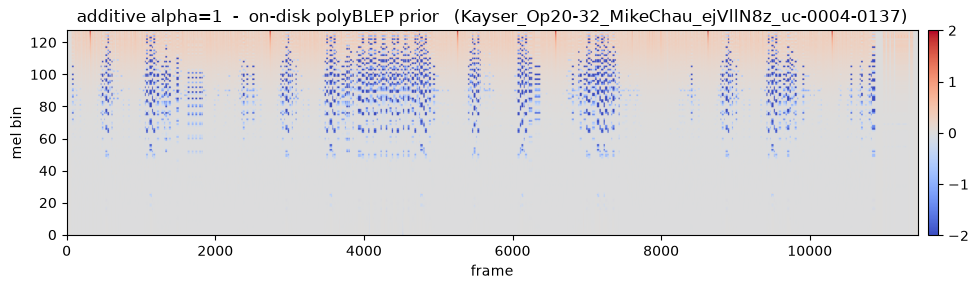

In [5]:
b = vis_bases[0]
row = manifest.loc[b]
n_samples = int(row["n_samples"]); offset_ms = float(row["offset_ms"])
outs1, sounding1 = render_variants(midi_path_for(b), n_samples, [amps_alpha(1.0)])
add_mel = variant_mel(outs1[0], sounding1, offset_ms)
baseline_full = load_mel(os.path.join(prior_dir, b + ".npy"))
target_full = load_mel(os.path.join(target_dir, b + ".npy"))
T = min(add_mel.shape[-1], baseline_full.shape[-1])
sanity_rmse = float(np.sqrt(np.mean((add_mel[:, :T] - baseline_full[:, :T]) ** 2)))
Tt = min(baseline_full.shape[-1], target_full.shape[-1])
prior_target_rmse = float(np.sqrt(np.mean((baseline_full[:, :Tt] - target_full[:, :Tt]) ** 2)))
ratio = sanity_rmse / prior_target_rmse
print(f"RMSE(additive alpha=1, on-disk prior) = {sanity_rmse:.4f}")
print(f"RMSE(on-disk prior, target)           = {prior_target_rmse:.4f}")
print(f"ratio = {ratio:.3f}   (soft threshold 0.25)")
if ratio > 0.25:
    print("WARNING: additive alpha=1 diverges from the production prior more than expected.")
else:
    print("OK: additive machinery matches the production polyBLEP prior.")

delta = add_mel[:, :T] - baseline_full[:, :T]
fig, ax = plt.subplots(figsize=(11, 3))
im = ax.imshow(delta, origin="lower", aspect="auto", vmin=-2, vmax=2, cmap="coolwarm")
ax.set_title(f"additive alpha=1  -  on-disk polyBLEP prior   ({b})")
ax.set_xlabel("frame"); ax.set_ylabel("mel bin"); fig.colorbar(im, ax=ax, pad=0.01)
fig.tight_layout(); fig.savefig(os.path.join(CACHE_DIR, "sanity_delta.png"), dpi=110)
display(fig); plt.close(fig)


## Part 2 — alpha sweep (K=40 book-stratified train recordings)

40 seeded book-stratified train recordings; the alpha grid `np.arange(0.5, 3.01, 0.25)` (11
values) rendered in **one additive pass** per recording, plus the **on-disk baseline** as a
reference row. Full-recording metrics (not clips) — the honest scoreboard.

**Crash-safe cache**: each `(basename, variant)` row is appended to
`sweep_metrics.csv` (`basename, book, variant, rmse, masked_rmse, mcd, n_frames`) and its per-bin
profile stored in `per_bin.npz` keyed `f"{basename}|{variant}"`. Re-running skips already-cached
pairs, so a crash resumes cheaply and reruns finish in seconds.

In [6]:
SWEEP_CSV = os.path.join(CACHE_DIR, "sweep_metrics.csv")
PER_BIN_NPZ = os.path.join(CACHE_DIR, "per_bin.npz")
CSV_COLS = ["basename", "book", "variant", "rmse", "masked_rmse", "mcd", "n_frames"]


def load_cache():
    if os.path.isfile(SWEEP_CSV):
        df = pd.read_csv(SWEEP_CSV)
    else:
        df = pd.DataFrame(columns=CSV_COLS)
    per_bin = {}
    if os.path.isfile(PER_BIN_NPZ):
        with np.load(PER_BIN_NPZ) as z:
            per_bin = {k: z[k] for k in z.files}
    return df, per_bin


def cached_pairs(df):
    return set(zip(df["basename"], df["variant"])) if len(df) else set()


def append_rows(new_rows, new_per_bin):
    """Append metric rows to the CSV and per-bin arrays to the npz (crash-safe, incremental)."""
    df = pd.DataFrame(new_rows, columns=CSV_COLS)
    header = not os.path.isfile(SWEEP_CSV)
    df.to_csv(SWEEP_CSV, mode="a", header=header, index=False)
    _, per_bin = load_cache()
    per_bin.update(new_per_bin)
    np.savez(PER_BIN_NPZ, **per_bin)


def stratified_train_recordings(k, seed=SEED):
    """K book-stratified train basenames, deterministic (round-robin over books, seeded shuffle)."""
    r = random.Random(seed)
    by_book = {}
    for b in split["train"]:
        by_book.setdefault(manifest.loc[b, "book"], []).append(b)
    for bk in by_book:
        pool = sorted(by_book[bk]); r.shuffle(pool); by_book[bk] = pool
    books_sorted = sorted(by_book)
    picked, bi = [], 0
    while len(picked) < k and any(by_book.values()):
        bk = books_sorted[bi % len(books_sorted)]; bi += 1
        if by_book[bk]:
            picked.append(by_book[bk].pop(0))
    return picked


ALPHA_GRID = np.round(np.arange(0.5, 3.01, 0.25), 3)
K_SWEEP = 40
sweep_bases = stratified_train_recordings(K_SWEEP)
print(f"alpha grid ({len(ALPHA_GRID)}): {list(ALPHA_GRID)}")
print(f"sweep recordings K={len(sweep_bases)}")
import collections
print("book balance:", dict(collections.Counter(manifest.loc[b, "book"] for b in sweep_bases)))


alpha grid (11): [0.5, 0.75, 1.0, 1.25, 1.5, 1.75, 2.0, 2.25, 2.5, 2.75, 3.0]
sweep recordings K=40
book balance: {'Kayser': 14, 'Paganini': 13, 'Wohlfahrt': 13}


In [7]:
def run_sweep(bases, variant_specs, desc="alpha"):
    """Render + score variant_specs for each recording, skipping cached (base,variant) pairs.

    variant_specs: list of (variant_str, amp_fn_or_None). None => on-disk baseline row.
    """
    df, _ = load_cache()
    done = cached_pairs(df)
    t0 = time.time()
    for i, b in enumerate(bases, 1):
        row = manifest.loc[b]
        book = row["book"]; n_samples = int(row["n_samples"]); offset_ms = float(row["offset_ms"])
        target = load_mel(os.path.join(target_dir, b + ".npy"))
        T = target.shape[-1]

        todo = [(vn, fn) for vn, fn in variant_specs if (b, vn) not in done]
        if not todo:
            print(f"[{i}/{len(bases)}] {b}  (all {len(variant_specs)} cached)"); continue

        new_rows, new_per_bin = [], {}
        # Baseline row (on-disk prior) — no render needed.
        additive = [(vn, fn) for vn, fn in todo if fn is not None]
        for vn, fn in todo:
            if fn is None:  # baseline
                bl = load_mel(os.path.join(prior_dir, b + ".npy"))
                snd = score_sounding(midi_path_for(b), n_samples)
                fm = sounding_frame_mask(shift_samples(snd.astype(np.float32),
                                                       offset_ms / 1000.0) > 0.5, T)
                m = mel_metrics(bl, target, fm)
                new_rows.append([b, book, vn, m["rmse"], m["masked_rmse"], m["mcd"], T])
                new_per_bin[f"{b}|{vn}"] = m["per_bin_rmse"]

        if additive:
            fns = [fn for _, fn in additive]
            outs, sounding = render_variants(midi_path_for(b), n_samples, fns)
            assert outs.shape[1] == n_samples
            for (vn, _), raw in zip(additive, outs):
                mel = variant_mel(raw, sounding, offset_ms)
                assert mel.shape[-1] == int(row["n_frames"]) == T, (mel.shape[-1], row["n_frames"], T)
                fmask = sounding_frame_mask(shift_samples(sounding.astype(np.float32),
                                                          offset_ms / 1000.0) > 0.5, T)
                m = mel_metrics(mel, target, fmask)
                new_rows.append([b, book, vn, m["rmse"], m["masked_rmse"], m["mcd"], T])
                new_per_bin[f"{b}|{vn}"] = m["per_bin_rmse"]

        append_rows(new_rows, new_per_bin)
        for vn, _ in todo:
            done.add((b, vn))
        el = time.time() - t0
        print(f"[{i}/{len(bases)}] {b}  +{len(todo)} variants  ({el:.0f}s, {el/i:.1f}s/rec)")
    print(f"done in {time.time() - t0:.0f}s")


alpha_specs = [(f"alpha={a:g}", amps_alpha(a)) for a in ALPHA_GRID]
alpha_specs.append(("baseline", None))
run_sweep(sweep_bases, alpha_specs, desc="alpha")


[1/40] Kayser_Op20-01_BernardChevalier_5gae40P1i0M-0001-0068  (all 12 cached)
[2/40] Paganini_Op01-04_SalvatoreAccardo_lZgWBwsO2EM-0000-0409  (all 12 cached)
[3/40] Wohlfahrt_Op45-03_BochanKang_VnMeLQx-Fgo-0579-0628  (all 12 cached)
[4/40] Kayser_Op20-24_BochanKang_04Avpty8WcE-0006-0092  (all 12 cached)
[5/40] Paganini_Op01-18_ItzhakPerlman_O-GwjpMDGDo-0000-0145  (all 12 cached)
[6/40] Wohlfahrt_Op45-24_BernardChevalier_vIbil_bWrns-0000-0070  (all 12 cached)
[7/40] Kayser_Op20-08_ClaudioCruz_d7372nSIriU-0004-0169  (all 12 cached)
[8/40] Paganini_Op01-07_SalvatoreAccardo_5Z56PBVAcGk-0000-0221  (all 12 cached)
[9/40] Wohlfahrt_Op45-18_BochanKang_Q1LmsVSNG6k-0198-0313  (all 12 cached)
[10/40] Kayser_Op20-12_AlexandrosIakovou_RGmrQRlG3_I-0008-0164  (all 12 cached)
[11/40] Paganini_Op01-24_AlicanSuner_R7fLO3egvwM-0000-0335  (all 12 cached)
[12/40] Wohlfahrt_Op45-02_BochanKang_6wN3qk12Me0-0083-0125  (all 12 cached)
[13/40] Kayser_Op20-32_FabricioValvasori_2f_nX-RLtc8-0000-0095  (all 12 cache

## Results — alpha sweep

Error-vs-alpha curve (mean +/- spread across recordings, faint per-recording lines, baseline
dashed, argmin marked); per-book overlay; the best-alpha table (overall / masked / per book) with
% improvement vs baseline; the per-mel-bin RMSE profile per alpha (kHz secondary axis via
`librosa.mel_frequencies`), where the baseline's HF-band error above ~bin 108 should collapse as
alpha grows; and delta panels at best alpha vs baseline for two recordings.

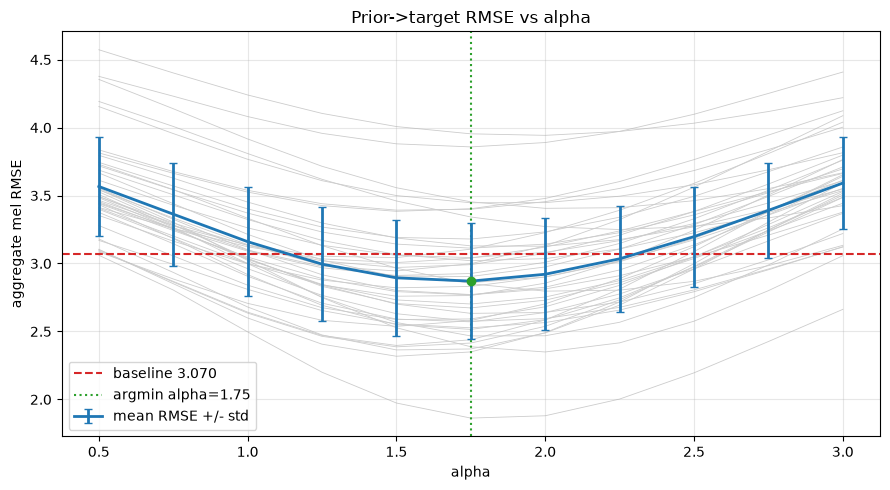

best alpha (aggregate RMSE): 1.75  -> 2.8703  (baseline 3.0697, improvement 6.5%)
best alpha (masked RMSE):    1.75  -> 2.7090  (baseline 2.9379, improvement 7.8%)


In [8]:
df, per_bin = load_cache()
sweep_df = df[df["variant"].str.startswith("alpha=") | (df["variant"] == "baseline")].copy()
alpha_df = sweep_df[sweep_df["variant"].str.startswith("alpha=")].copy()
alpha_df["alpha"] = alpha_df["variant"].str.replace("alpha=", "").astype(float)
base_df = sweep_df[sweep_df["variant"] == "baseline"]

grid = sorted(alpha_df["alpha"].unique())
def curve(dfx, col):
    g = dfx.groupby("alpha")[col]
    return np.array([g.get_group(a).mean() for a in grid]), np.array([g.get_group(a).std() for a in grid])

mean_rmse, std_rmse = curve(alpha_df, "rmse")
mean_mask, _ = curve(alpha_df, "masked_rmse")
base_rmse = base_df["rmse"].mean(); base_mask = base_df["masked_rmse"].mean()
best_i = int(np.argmin(mean_rmse)); best_alpha = grid[best_i]
best_mi = int(np.argmin(mean_mask)); best_alpha_masked = grid[best_mi]

fig, ax = plt.subplots(figsize=(9, 5))
for b in alpha_df["basename"].unique():
    d = alpha_df[alpha_df["basename"] == b].sort_values("alpha")
    ax.plot(d["alpha"], d["rmse"], color="0.8", lw=0.6, zorder=1)
ax.errorbar(grid, mean_rmse, yerr=std_rmse, color="C0", lw=2, capsize=3, label="mean RMSE +/- std", zorder=3)
ax.axhline(base_rmse, color="C3", ls="--", label=f"baseline {base_rmse:.3f}")
ax.axvline(best_alpha, color="C2", ls=":", label=f"argmin alpha={best_alpha:g}")
ax.scatter([best_alpha], [mean_rmse[best_i]], color="C2", zorder=5)
ax.set_xlabel("alpha"); ax.set_ylabel("aggregate mel RMSE"); ax.set_title("Prior->target RMSE vs alpha")
ax.legend(); ax.grid(alpha=0.3)
fig.tight_layout(); fig.savefig(os.path.join(CACHE_DIR, "rmse_vs_alpha.png"), dpi=120)
display(fig); plt.close(fig)

print(f"best alpha (aggregate RMSE): {best_alpha:g}  -> {mean_rmse[best_i]:.4f}  "
      f"(baseline {base_rmse:.4f}, improvement {100*(base_rmse-mean_rmse[best_i])/base_rmse:.1f}%)")
print(f"best alpha (masked RMSE):    {best_alpha_masked:g}  -> {mean_mask[best_mi]:.4f}  "
      f"(baseline {base_mask:.4f}, improvement {100*(base_mask-mean_mask[best_mi])/base_mask:.1f}%)")


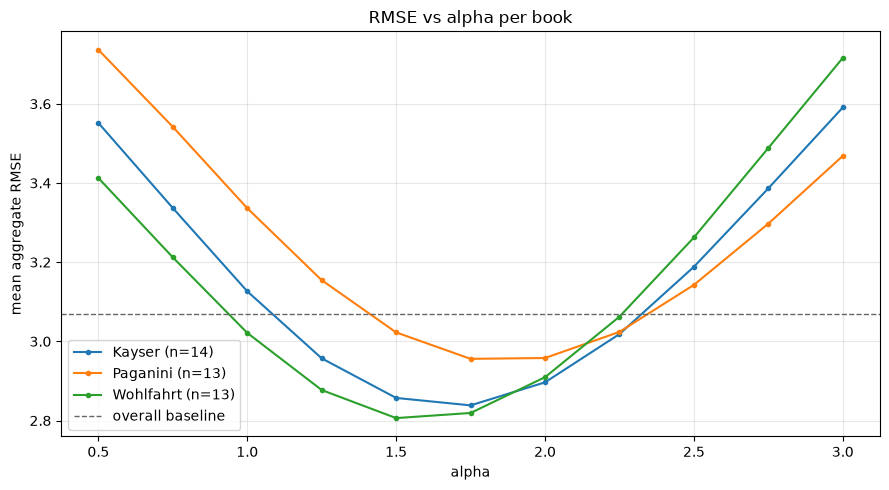

### Best-alpha table

,scope,best_alpha,best_rmse,baseline_rmse,improvement
0,overall,1.75,2.8703,3.0697,+6.5%
1,overall (masked),1.75,2.7090,2.9379,+7.8%
2,Kayser,1.75,2.8384,3.0292,+6.3%
3,Paganini,1.75,2.9558,3.2444,+8.9%
4,Wohlfahrt,1.5,2.8063,2.9387,+4.5%


In [9]:
fig, ax = plt.subplots(figsize=(9, 5))
per_book_best = {}
for bk in sorted(alpha_df["book"].unique()):
    d = alpha_df[alpha_df["book"] == bk]
    m = np.array([d[d["alpha"] == a]["rmse"].mean() for a in grid])
    ax.plot(grid, m, marker="o", ms=3, label=f"{bk} (n={d['basename'].nunique()})")
    bbi = int(np.nanargmin(m)); per_book_best[bk] = (grid[bbi], m[bbi],
                                                     base_df[base_df["book"] == bk]["rmse"].mean())
ax.axhline(base_rmse, color="0.4", ls="--", lw=1, label="overall baseline")
ax.set_xlabel("alpha"); ax.set_ylabel("mean aggregate RMSE"); ax.set_title("RMSE vs alpha per book")
ax.legend(); ax.grid(alpha=0.3)
fig.tight_layout(); fig.savefig(os.path.join(CACHE_DIR, "rmse_vs_alpha_per_book.png"), dpi=120)
display(fig); plt.close(fig)

tbl = [["overall", f"{best_alpha:g}", f"{mean_rmse[best_i]:.4f}", f"{base_rmse:.4f}",
        f"{100*(base_rmse-mean_rmse[best_i])/base_rmse:+.1f}%"]]
tbl.append(["overall (masked)", f"{best_alpha_masked:g}", f"{mean_mask[best_mi]:.4f}",
            f"{base_mask:.4f}", f"{100*(base_mask-mean_mask[best_mi])/base_mask:+.1f}%"])
for bk, (a, v, bv) in per_book_best.items():
    tbl.append([bk, f"{a:g}", f"{v:.4f}", f"{bv:.4f}", f"{100*(bv-v)/bv:+.1f}%"])
best_table = pd.DataFrame(tbl, columns=["scope", "best_alpha", "best_rmse", "baseline_rmse", "improvement"])
display(Markdown("### Best-alpha table"))
display(best_table)
best_table.to_csv(os.path.join(CACHE_DIR, "best_alpha_table.csv"), index=False)


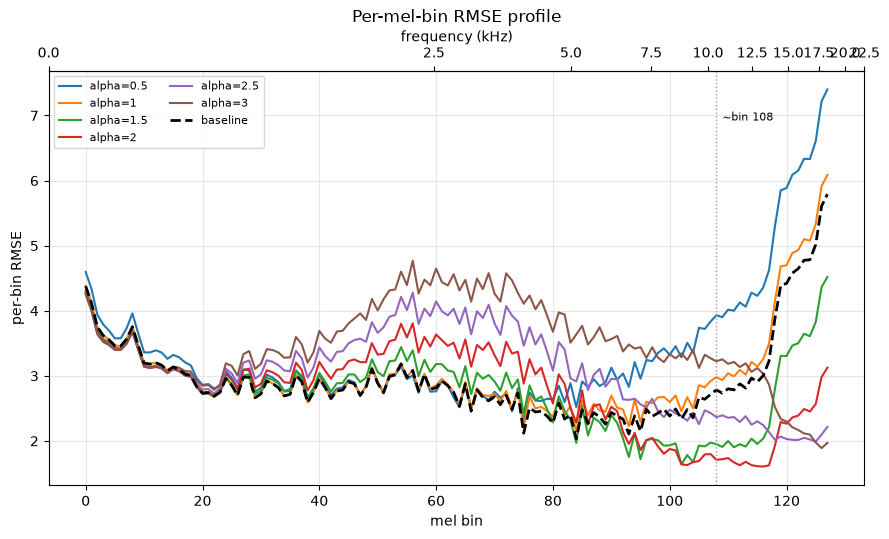

In [10]:
mel_hz = librosa.mel_frequencies(n_mels=N_MELS, fmin=0, fmax=SR / 2)

def mean_per_bin(variant):
    keys = [k for k in per_bin if k.split("|", 1)[1] == variant]
    return np.mean([per_bin[k] for k in keys], axis=0) if keys else None

fig, ax = plt.subplots(figsize=(9, 5.5))
bins = np.arange(N_MELS)
show_alphas = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0]
for a in show_alphas:
    prof = mean_per_bin(f"alpha={a:g}")
    if prof is not None:
        ax.plot(bins, prof, label=f"alpha={a:g}")
bl_prof = mean_per_bin("baseline")
if bl_prof is not None:
    ax.plot(bins, bl_prof, "k--", lw=2, label="baseline")
ax.axvline(108, color="0.6", ls=":", lw=1); ax.text(109, ax.get_ylim()[1]*0.9, "~bin 108", fontsize=8)
ax.set_xlabel("mel bin"); ax.set_ylabel("per-bin RMSE"); ax.set_title("Per-mel-bin RMSE profile")
ax.legend(fontsize=8, ncol=2); ax.grid(alpha=0.3)
secax = ax.secondary_xaxis("top", functions=(lambda x: np.interp(x, bins, mel_hz) / 1000,
                                             lambda f: np.interp(f * 1000, mel_hz, bins)))
secax.set_xlabel("frequency (kHz)")
fig.tight_layout(); fig.savefig(os.path.join(CACHE_DIR, "per_bin_rmse.png"), dpi=120)
display(fig); plt.close(fig)


### delta panels — Kayser_Op20-01_BernardChevalier_5gae40P1i0M-0001-0068

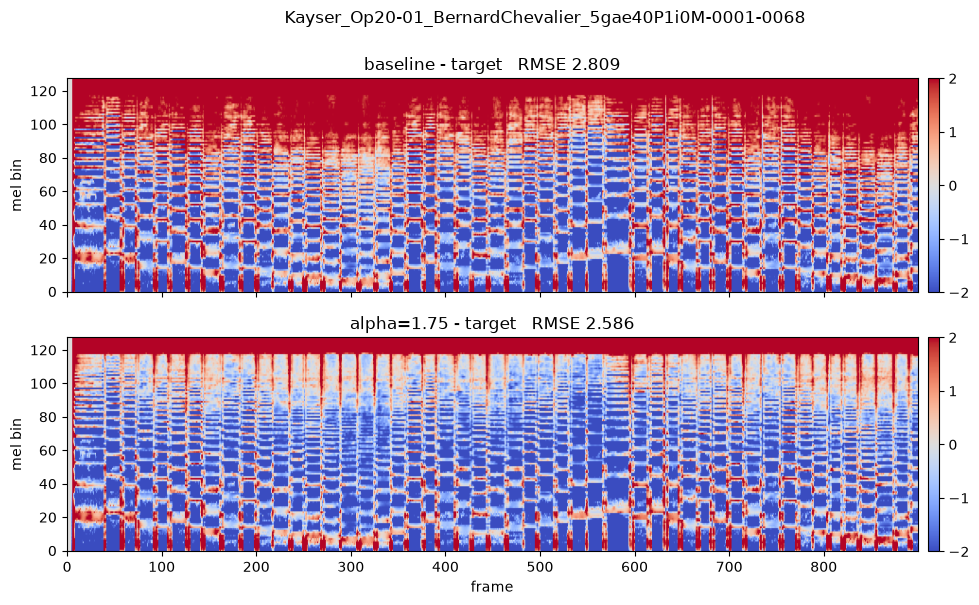

### delta panels — Paganini_Op01-04_SalvatoreAccardo_lZgWBwsO2EM-0000-0409

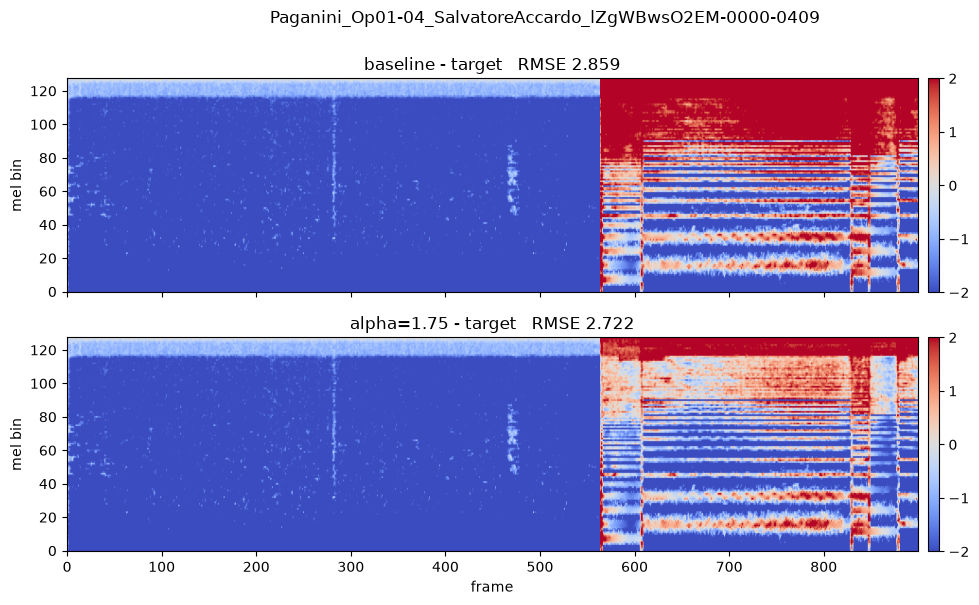

In [11]:
# Delta-mel panels: best-alpha vs baseline for 2 recordings (full-recording, clipped view).
panel_bases = sweep_bases[:2]
best_fn = amps_alpha(best_alpha)
for b in panel_bases:
    row = manifest.loc[b]
    n_samples = int(row["n_samples"]); offset_ms = float(row["offset_ms"])
    target = load_mel(os.path.join(target_dir, b + ".npy"))
    baseline_full = load_mel(os.path.join(prior_dir, b + ".npy"))
    outs, sounding = render_variants(midi_path_for(b), n_samples, [best_fn])
    best_mel = variant_mel(outs[0], sounding, offset_ms)
    T = min(target.shape[-1], best_mel.shape[-1], baseline_full.shape[-1])
    win = slice(0, min(T, 900))
    d_base = baseline_full[:, win] - target[:, win]
    d_best = best_mel[:, win] - target[:, win]
    fig, axes = plt.subplots(2, 1, figsize=(11, 6), sharex=True)
    for ax, dd, ttl in [(axes[0], d_base, f"baseline - target"),
                        (axes[1], d_best, f"alpha={best_alpha:g} - target")]:
        im = ax.imshow(dd, origin="lower", aspect="auto", vmin=-2, vmax=2, cmap="coolwarm")
        ax.set_title(f"{ttl}   RMSE {np.sqrt(np.mean(dd**2)):.3f}"); ax.set_ylabel("mel bin")
        fig.colorbar(im, ax=ax, pad=0.01)
    axes[-1].set_xlabel("frame"); fig.suptitle(b, y=1.0); fig.tight_layout()
    fig.savefig(os.path.join(CACHE_DIR, f"delta_best_vs_baseline_{b}.png"), dpi=110, bbox_inches="tight")
    display(Markdown(f"### delta panels — {b}"))
    display(fig); plt.close(fig)


## Part 3 — rounded-corner mini-sweep

Corner harmonic `n_c in {2, 4, 8, 12, 16, 24, 32}` at `p=2, alpha_below=1.0`, over the same 40
recordings via the same crash-safe cache. Does a per-harmonic rounded corner beat the best global
tilt? We plot error-vs-`n_c` against the best-alpha reference line.

In [12]:
NC_GRID = [2, 4, 8, 12, 16, 24, 32]
corner_specs = [(f"corner nc={nc} p=2 ab=1", amps_corner(nc, 2, 1.0)) for nc in NC_GRID]
run_sweep(sweep_bases, corner_specs, desc="corner")


[1/40] Kayser_Op20-01_BernardChevalier_5gae40P1i0M-0001-0068  (all 7 cached)
[2/40] Paganini_Op01-04_SalvatoreAccardo_lZgWBwsO2EM-0000-0409  (all 7 cached)
[3/40] Wohlfahrt_Op45-03_BochanKang_VnMeLQx-Fgo-0579-0628  (all 7 cached)
[4/40] Kayser_Op20-24_BochanKang_04Avpty8WcE-0006-0092  (all 7 cached)
[5/40] Paganini_Op01-18_ItzhakPerlman_O-GwjpMDGDo-0000-0145  (all 7 cached)
[6/40] Wohlfahrt_Op45-24_BernardChevalier_vIbil_bWrns-0000-0070  (all 7 cached)
[7/40] Kayser_Op20-08_ClaudioCruz_d7372nSIriU-0004-0169  (all 7 cached)
[8/40] Paganini_Op01-07_SalvatoreAccardo_5Z56PBVAcGk-0000-0221  (all 7 cached)
[9/40] Wohlfahrt_Op45-18_BochanKang_Q1LmsVSNG6k-0198-0313  (all 7 cached)
[10/40] Kayser_Op20-12_AlexandrosIakovou_RGmrQRlG3_I-0008-0164  (all 7 cached)
[11/40] Paganini_Op01-24_AlicanSuner_R7fLO3egvwM-0000-0335  (all 7 cached)
[12/40] Wohlfahrt_Op45-02_BochanKang_6wN3qk12Me0-0083-0125  (all 7 cached)
[13/40] Kayser_Op20-32_FabricioValvasori_2f_nX-RLtc8-0000-0095  (all 7 cached)
[14/40] Pa

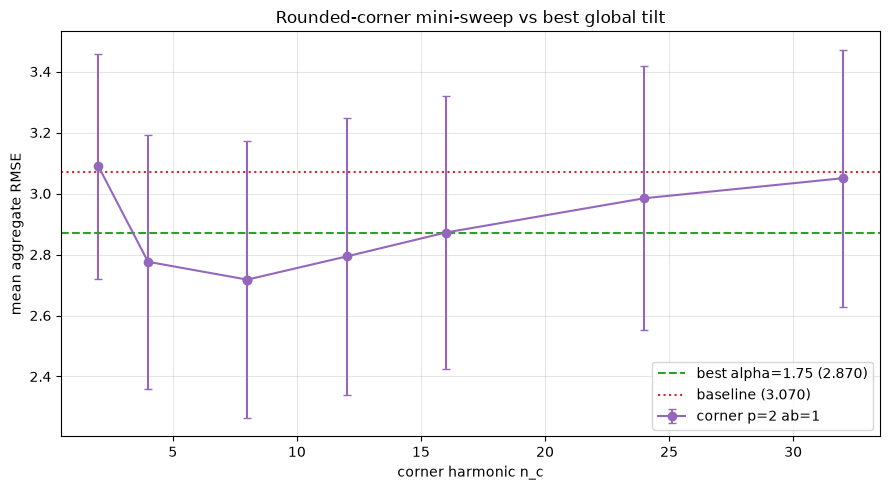

best corner: n_c=8  RMSE 2.7177
best alpha:  alpha=1.75  RMSE 2.8703
corner beats best-alpha? True  (delta -0.1526)


In [13]:
df, per_bin = load_cache()
corner_df = df[df["variant"].str.startswith("corner nc=")].copy()
corner_df["n_c"] = corner_df["variant"].str.extract(r"nc=(\d+)").astype(float)
nc_grid = sorted(corner_df["n_c"].unique())
mean_nc = np.array([corner_df[corner_df["n_c"] == nc]["rmse"].mean() for nc in nc_grid])
std_nc = np.array([corner_df[corner_df["n_c"] == nc]["rmse"].std() for nc in nc_grid])
best_nc_i = int(np.argmin(mean_nc)); best_nc = nc_grid[best_nc_i]

fig, ax = plt.subplots(figsize=(9, 5))
ax.errorbar(nc_grid, mean_nc, yerr=std_nc, marker="o", capsize=3, color="C4", label="corner p=2 ab=1")
ax.axhline(mean_rmse[best_i], color="C2", ls="--", label=f"best alpha={best_alpha:g} ({mean_rmse[best_i]:.3f})")
ax.axhline(base_rmse, color="C3", ls=":", label=f"baseline ({base_rmse:.3f})")
ax.scatter([best_nc], [mean_nc[best_nc_i]], color="C4", zorder=5)
ax.set_xlabel("corner harmonic n_c"); ax.set_ylabel("mean aggregate RMSE")
ax.set_title("Rounded-corner mini-sweep vs best global tilt"); ax.legend(); ax.grid(alpha=0.3)
fig.tight_layout(); fig.savefig(os.path.join(CACHE_DIR, "rmse_vs_corner.png"), dpi=120)
display(fig); plt.close(fig)

corner_beats_alpha = mean_nc[best_nc_i] < mean_rmse[best_i]
print(f"best corner: n_c={best_nc:g}  RMSE {mean_nc[best_nc_i]:.4f}")
print(f"best alpha:  alpha={best_alpha:g}  RMSE {mean_rmse[best_i]:.4f}")
print(f"corner beats best-alpha? {corner_beats_alpha}  "
      f"(delta {mean_nc[best_nc_i]-mean_rmse[best_i]:+.4f})")


## Decision summary

In [14]:
lines = []
lines.append(f"Sweep: K={len(sweep_bases)} book-stratified train recordings, alpha grid {list(ALPHA_GRID)}.")
lines.append("")
lines.append(f"**Best alpha (aggregate RMSE):** {best_alpha:g}  ->  {mean_rmse[best_i]:.4f}  "
             f"(baseline {base_rmse:.4f}, {100*(base_rmse-mean_rmse[best_i])/base_rmse:+.1f}% improvement).")
lines.append(f"**Best alpha (masked RMSE):** {best_alpha_masked:g}  ->  {mean_mask[best_mi]:.4f}  "
             f"(baseline {base_mask:.4f}, {100*(base_mask-mean_mask[best_mi])/base_mask:+.1f}% improvement).")
lines.append("")
lines.append("**Per-book best alpha:** " +
             ", ".join(f"{bk}: alpha={a:g} ({100*(bv-v)/bv:+.1f}%)"
                       for bk, (a, v, bv) in per_book_best.items()) + ".")
lines.append("")
verdict = ("the rounded corner WINS" if corner_beats_alpha else "the global tilt WINS")
lines.append(f"**Corner vs tilt:** best corner n_c={best_nc:g} (p=2, alpha_below=1) gives "
             f"{mean_nc[best_nc_i]:.4f} vs best-alpha {mean_rmse[best_i]:.4f} -> {verdict} "
             f"(delta {mean_nc[best_nc_i]-mean_rmse[best_i]:+.4f}).")
lines.append("")
lines.append("Reminder: this is a transport-distance proxy, not a model-output guarantee. The "
             "follow-up (a separate task) is to add the chosen source to `synthesizePrior.py`, "
             "rebuild priors with `build_prior.py`, and retrain to confirm the win survives.")
display(Markdown("\n".join(lines)))
print("\n".join(l.replace("**", "") for l in lines))


Sweep: K=40 book-stratified train recordings, alpha grid [0.5, 0.75, 1.0, 1.25, 1.5, 1.75, 2.0, 2.25, 2.5, 2.75, 3.0].

**Best alpha (aggregate RMSE):** 1.75  ->  2.8703  (baseline 3.0697, +6.5% improvement).
**Best alpha (masked RMSE):** 1.75  ->  2.7090  (baseline 2.9379, +7.8% improvement).

**Per-book best alpha:** Kayser: alpha=1.75 (+6.3%), Paganini: alpha=1.75 (+8.9%), Wohlfahrt: alpha=1.5 (+4.5%).

**Corner vs tilt:** best corner n_c=8 (p=2, alpha_below=1) gives 2.7177 vs best-alpha 2.8703 -> the rounded corner WINS (delta -0.1526).

Reminder: this is a transport-distance proxy, not a model-output guarantee. The follow-up (a separate task) is to add the chosen source to `synthesizePrior.py`, rebuild priors with `build_prior.py`, and retrain to confirm the win survives.

Sweep: K=40 book-stratified train recordings, alpha grid [0.5, 0.75, 1.0, 1.25, 1.5, 1.75, 2.0, 2.25, 2.5, 2.75, 3.0].

Best alpha (aggregate RMSE): 1.75  ->  2.8703  (baseline 3.0697, +6.5% improvement).
Best alpha (masked RMSE): 1.75  ->  2.7090  (baseline 2.9379, +7.8% improvement).

Per-book best alpha: Kayser: alpha=1.75 (+6.3%), Paganini: alpha=1.75 (+8.9%), Wohlfahrt: alpha=1.5 (+4.5%).

Corner vs tilt: best corner n_c=8 (p=2, alpha_below=1) gives 2.7177 vs best-alpha 2.8703 -> the rounded corner WINS (delta -0.1526).

Reminder: this is a transport-distance proxy, not a model-output guarantee. The follow-up (a separate task) is to add the chosen source to `synthesizePrior.py`, rebuild priors with `build_prior.py`, and retrain to confirm the win survives.
